In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px


In [2]:
url = "https://ucdp.uu.se/downloads/ged/ged211-csv.zip"
df = pd.read_csv(url, compression='zip')

/var/folders/sf/fgnzjnxx5s3296jtyx58zsxh0000gn/T/ipykernel_11478/1126433736.py:2: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(url, compression='zip')


In [3]:
df['date_start'] = pd.to_datetime(df['date_start'])
df['date_end'] = pd.to_datetime(df['date_end'])
df = df.set_index('date_start', drop = True).sort_index()

In [4]:
df.head()

,id,relid,year,active_year,code_status,type_of_violence,conflict_dset_id,conflict_new_id,conflict_name,dyad_dset_id,...,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob
date_start,,,,,,,,,,,,,,,,,,,,,
1989-01-01,94814,IND-1989-1-387-1,1989,1,Clear,1,351,351,India: Punjab/Khalistan,775,...,1989-12-31,172,633,0,0,805,805,805,750.0,NaN
1989-01-01,94817,IND-1989-1-387-2,1989,1,Clear,1,351,351,India: Punjab/Khalistan,775,...,1989-01-01,2,3,0,0,5,5,5,750.0,NaN
1989-01-01,14054,SAF-1989-2-312-9,1989,1,Clear,2,5450,4840,Supporters of ANC - Supporters of IFP,5450,...,1989-01-31,0,0,1,0,1,1,1,NaN,NaN
1989-01-01,14320,SAF-1989-3-560-22,1989,1,Clear,3,102,477,Government of South Africa - Civilians,102,...,1989-01-31,0,0,1,0,1,1,1,560.0,NaN
1989-01-01,17920,SAF-1989-3-560-26,1989,1,Clear,3,102,477,Government of South Africa - Civilians,102,...,1989-12-31,0,0,1,0,1,1,1,560.0,NaN


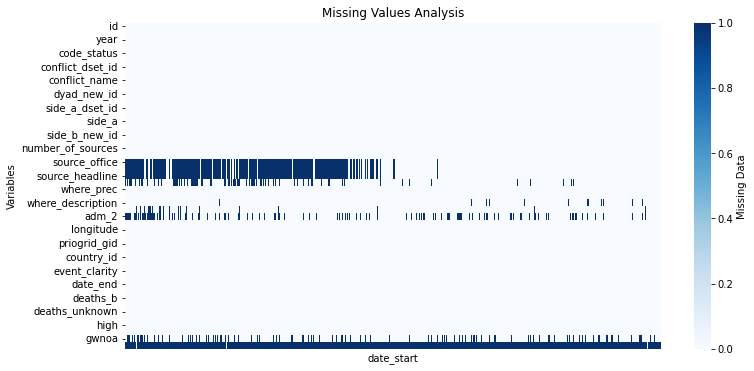

In [5]:
def plot_na_heatmap(df):
    plt.figure(figsize = (12,6))
    sns.heatmap(df.isna().transpose(),
            cmap = 'Blues',
            cbar_kws = {'label' : 'Missing Data'},
            xticklabels = False)
    plt.title('Missing Values Analysis')
    plt.ylabel('Variables')

plot_na_heatmap(df)

In [6]:
columns = ['id', 'year', 'active_year', 
    'type_of_violence', 'conflict_name', 'side_a', 
    'side_b', 'where_prec', 'where_coordinates', 
    'latitude', 'longitude', 'country',
    'region', 'date_prec', 
    'date_end', 'deaths_a', 'deaths_b', 
    'deaths_civilians', 'deaths_unknown']

df = df[columns]
df.head()

,id,year,active_year,type_of_violence,conflict_name,side_a,side_b,where_prec,where_coordinates,latitude,longitude,country,region,date_prec,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
date_start,,,,,,,,,,,,,,,,,,,
1989-01-01,94814,1989,1,1,India: Punjab/Khalistan,Government of India,Sikh insurgents,4,Punjab state,30.916670,75.416670,India,Asia,5,1989-12-31,172,633,0,0
1989-01-01,94817,1989,1,1,India: Punjab/Khalistan,Government of India,Sikh insurgents,2,Batala town,31.809355,75.217601,India,Asia,1,1989-01-01,2,3,0,0
1989-01-01,14054,1989,1,2,Supporters of ANC - Supporters of IFP,Supporters of ANC,Supporters of IFP,1,Mpumalanga town,-29.812919,30.636458,South Africa,Africa,4,1989-01-31,0,0,1,0
1989-01-01,14320,1989,1,3,Government of South Africa - Civilians,Government of South Africa,Civilians,1,Khutsong township,-26.324593,27.321027,South Africa,Africa,4,1989-01-31,0,0,1,0
1989-01-01,17920,1989,1,3,Government of South Africa - Civilians,Government of South Africa,Civilians,1,Pimville town,-26.272301,27.906818,South Africa,Africa,5,1989-12-31,0,0,1,0


In [7]:
## NA proportion after dropping columns
df.isna().sum()/len(df)

id                   0.0
year                 0.0
active_year          0.0
type_of_violence     0.0
conflict_name        0.0
side_a               0.0
side_b               0.0
where_prec           0.0
where_coordinates    0.0
latitude             0.0
longitude            0.0
country              0.0
region               0.0
date_prec            0.0
date_end             0.0
deaths_a             0.0
deaths_b             0.0
deaths_civilians     0.0
deaths_unknown       0.0
dtype: float64

In [8]:
#Deaths 
df[['deaths_a', 'deaths_b', 'deaths_civilians', 'deaths_unknown']].describe()

,deaths_a,deaths_b,deaths_civilians,deaths_unknown
count,261864.000000,261864.000000,261864.000000,261864.000000
mean,1.901403,2.460002,3.992794,1.920928
std,58.489905,32.157393,173.874671,115.988807
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,1.000000,2.000000,1.000000,0.000000
max,14288.000000,9505.000000,40000.000000,48183.000000


Text(0.5, 0, 'Year')

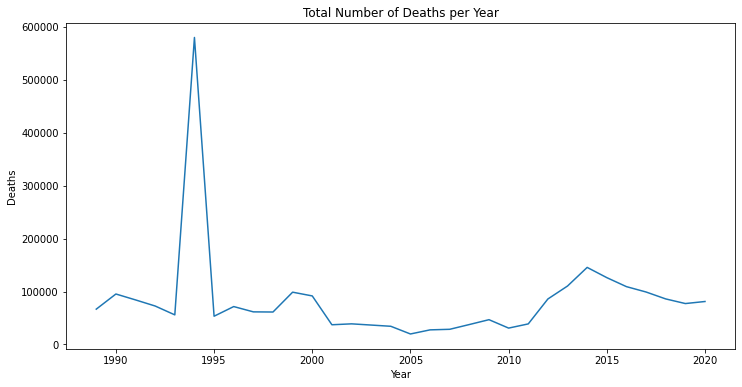

In [9]:
df['deaths_total'] = df['deaths_a'] + df['deaths_b'] + df['deaths_civilians'] + df['deaths_unknown']

deaths_total_yearly = df.groupby('year')['deaths_total'].sum()
years = np.unique(df['year'])

plt.figure(figsize = (12,6))
plt.plot(years, deaths_total_yearly)
plt.title('Total Number of Deaths per Year')
plt.ylabel('Deaths')
plt.xlabel('Year')

In [10]:
deaths_total_yearly_regional = df.groupby(['region','year'])['deaths_total'].sum()
deaths_total_yearly_regional = pd.DataFrame(deaths_total_yearly_regional)
deaths_total_yearly_regional = deaths_total_yearly_regional.reset_index()

fig = px.line(deaths_total_yearly_regional, x='year', y='deaths_total', color='region')
fig.update_layout(hovermode = 'x unified')

In [11]:
px.set_mapbox_access_token(open(".mapbox_token").read())

px.scatter_mapbox(df, lat='latitude', lon='longitude', color='deaths_total', animation_frame='year')